In [ ]:
!nvidia-smi
!pwd

Fri Nov  6 09:47:29 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.32.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   31C    P0    23W / 300W |      0MiB / 16130MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Train YOLOv5 on Fire & Smoke Dataset

This notebook shows training on **your own custom objects**. Many thanks to Ultralytics for putting this repository together - we hope that in combination with clean data management tools at Roboflow, this technologoy will become easily accessible to any developer wishing to use computer vision in their projects.


### Steps Covered 

We will do the steps required to train YOLOv5 on our dataset. 

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download custom YOLOv5 object detection data
* Write our YOLOv5 Training configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference



#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
%cd /content/drive/My Drive/Factory Security Automation

/content/drive/My Drive/Factory Security Automation


In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.7.0+cu101 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', major=7, minor=0, total_memory=16130MB, multi_processor_count=80)


In [ ]:
from google.colab import drive
drive.unmount('/content/drive')

AttributeError: ignored

In [ ]:
!cp -r /content/yolov5 '/content/drive/My Drive/Factory Security Automation'

In [ ]:
# Export code snippet and paste here
%cd /content/drive/My Drive/Factory Security Automation/dataset/
!unzip Fire_Dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Fire_Dataset/valid/images/WEBSmoke3302.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3303.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3304.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3305.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3306.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3307.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3308.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3309.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3310.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3311.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3312.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3313.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3314.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3315.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3316.jpg  
  inflating: Fire_Dataset/valid/images/WEBSmoke3317.jpg  
  inflating: Fire_Dat

In [ ]:
!pwd

/content/drive/My Drive/Factory Security Automation/dataset


In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
#%cat data.yaml
%cd Fire_Smoke/
%cat data.yaml

/content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke
train: /content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/train/images
val: /content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/valid/images

nc: 2
names: ['smoke', 'fire']

# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [ ]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
num_classes

'2'

In [ ]:
#this is the model configuration we will use for our tutorial 
%cat '/content/drive/My Drive/Factory Security Automation/yolov5/models/yolov5s.yaml'

# parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))


In [ ]:
%%writetemplate /content/drive/My Drive/Factory Security Automation/yolov5/models/yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
!pwd

/content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke


In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd '/content/drive/My Drive/Factory Security Automation/yolov5/'
!python train.py --img 416 --batch 32 --epochs 2000 --data '/content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/data.yaml' --cfg '/content/drive/My Drive/Factory Security Automation/yolov5_old/models/custom_yolov5s.yaml' --weights '' --name yolov5s_results  --cache

/content/drive/My Drive/Factory Security Automation/yolov5
Using CUDA device0 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', total_memory=16130MB)

Namespace(adam=False, batch_size=32, bucket='', cache_images=True, cfg='/content/drive/My Drive/Factory Security Automation/yolov5_old/models/custom_yolov5s.yaml', data='/content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/data.yaml', device='', epochs=2000, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], local_rank=-1, log_imgs=10, logdir='runs/', multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=32, weights='', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-11-06 10:47:13.334890: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcud

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

AssertionError: ignored

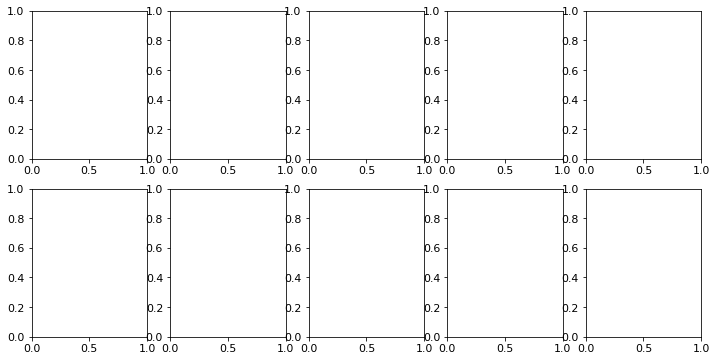

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.general import plot_results; plot_results()  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/exp0_yolov5s_results/results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


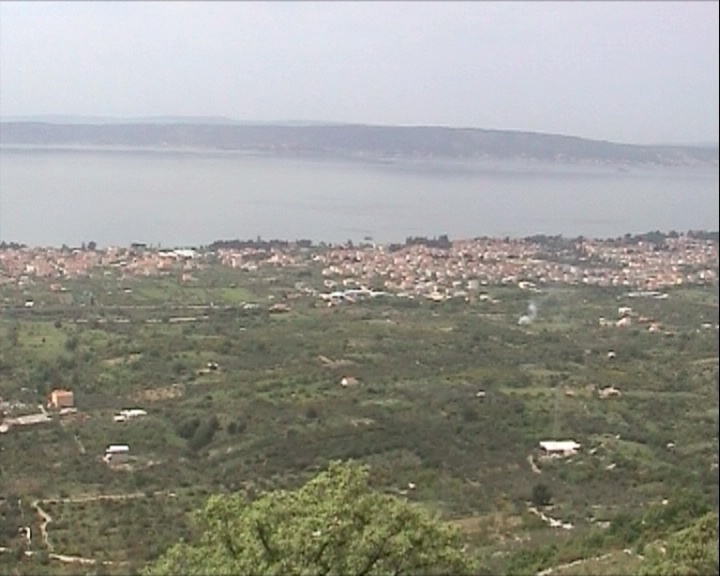

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/test/images/FacultyofElectricalEngineeringSplitUniversity_WEBSmoke1561.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


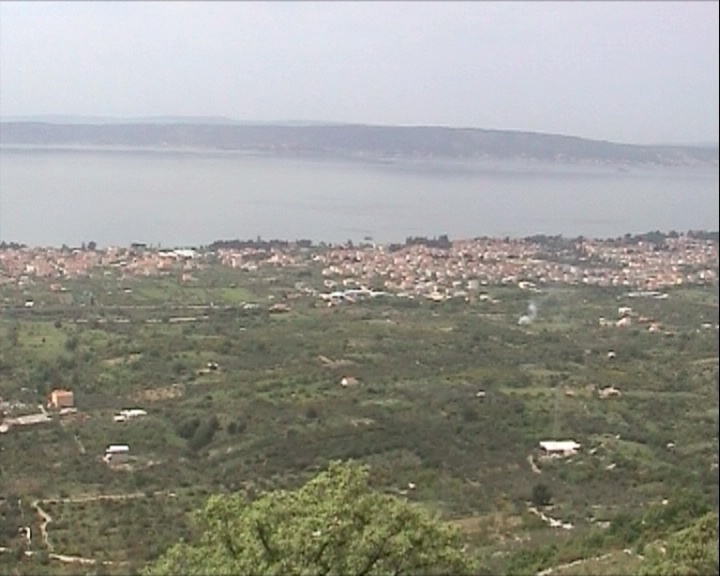

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/test/images/FacultyofElectricalEngineeringSplitUniversity_WEBSmoke1561.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

exp0_yolov5s_results/  exp1_yolov5s_results/


In [ ]:
%ls runs/exp1_yolov5s_results/weights

best.pt  last.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/exp1_yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source "/content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/test/images"

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.45, save_conf=False, save_dir='inference/output', save_txt=False, source='/content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/test/images', update=False, view_img=False, weights=['runs/exp1_yolov5s_results/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', total_memory=16280MB)

Fusing layers... 
Model Summary: 140 layers, 7.24922e+06 parameters, 0 gradients
image 1/402 /content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/test/images/FacultyofElectricalEngineeringSplitUniversity_WEBSmoke1561.jpg: 352x416 1 smokes, Done. (0.012s)
image 2/402 /content/drive/My Drive/Factory Security Automation/dataset/Fire_Smoke/test/images/FacultyofElectricalEngineeringSplitUniversity_WEBSmoke1562.jpg: 352x416 1 smokes, Done. (0.011s)
image 3/402 /content/drive/My Drive/Factory Security Automation/datase

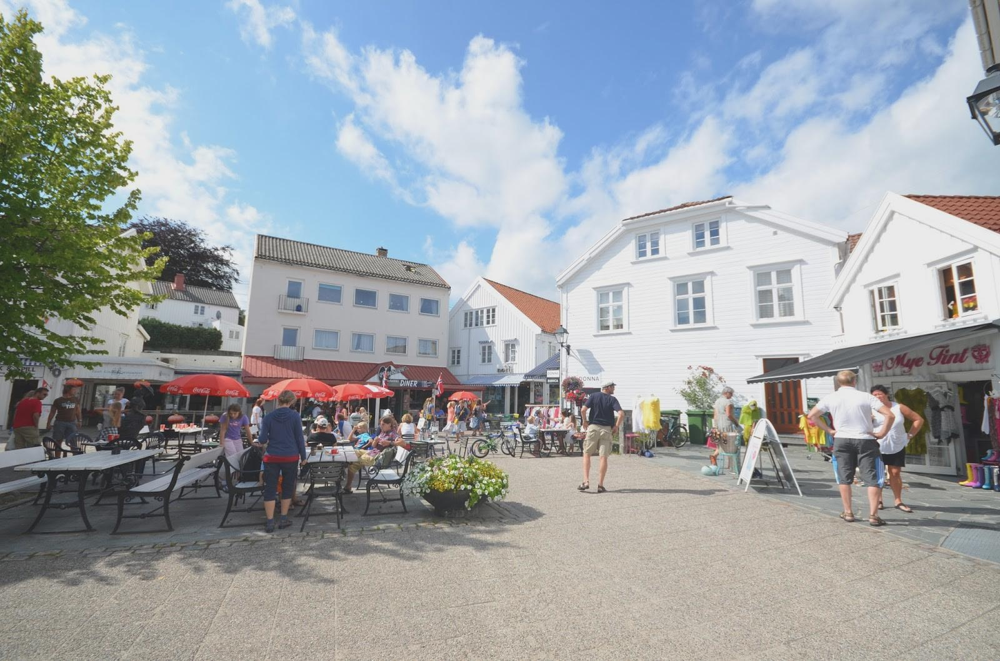

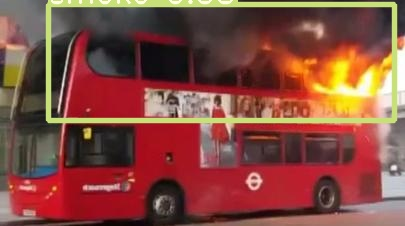

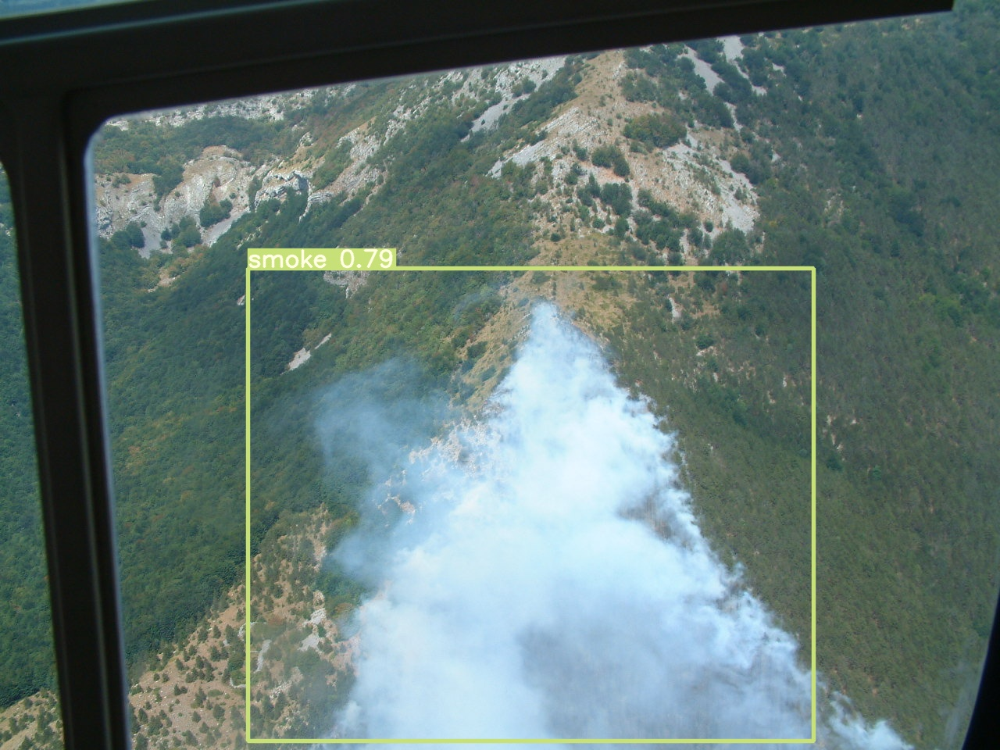

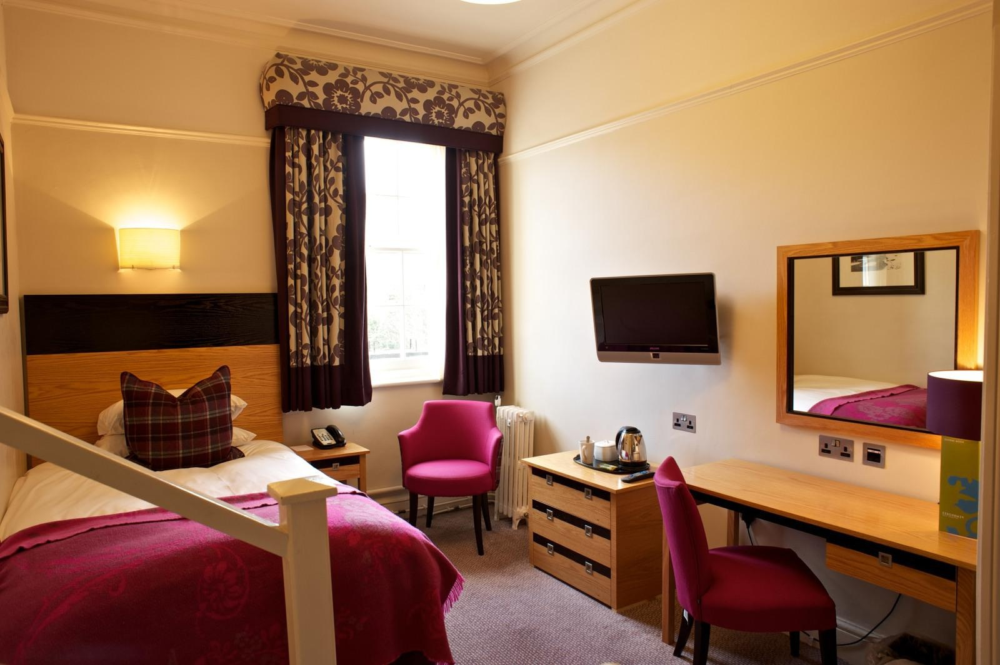

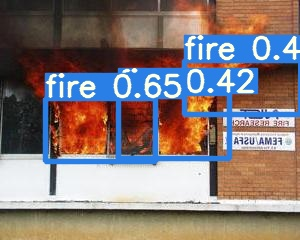

...

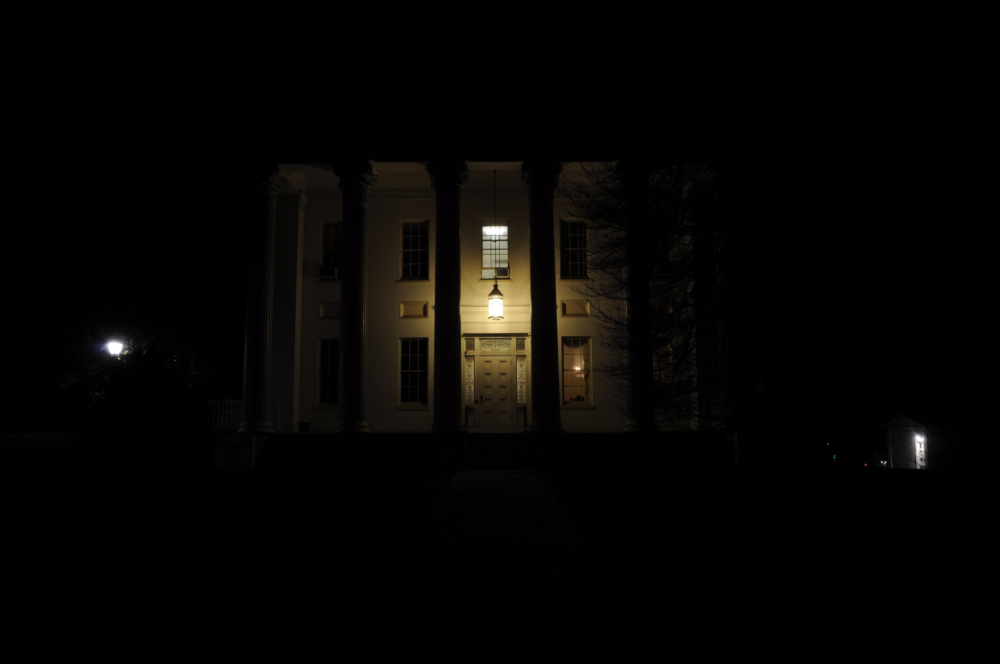

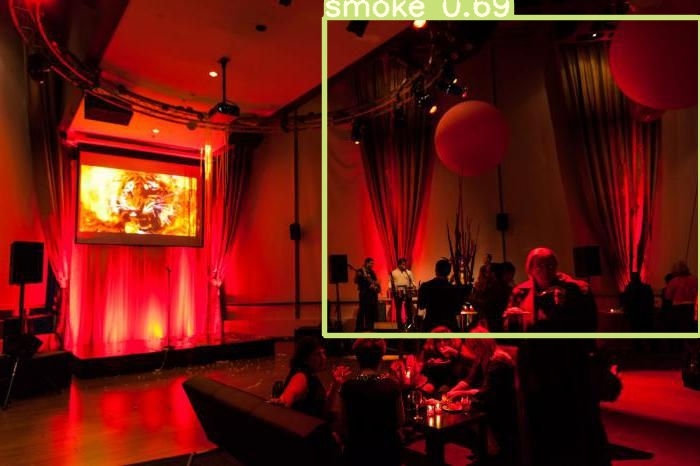

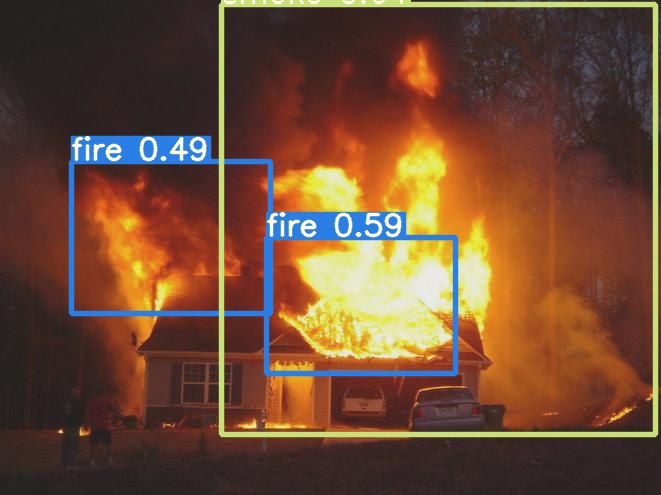

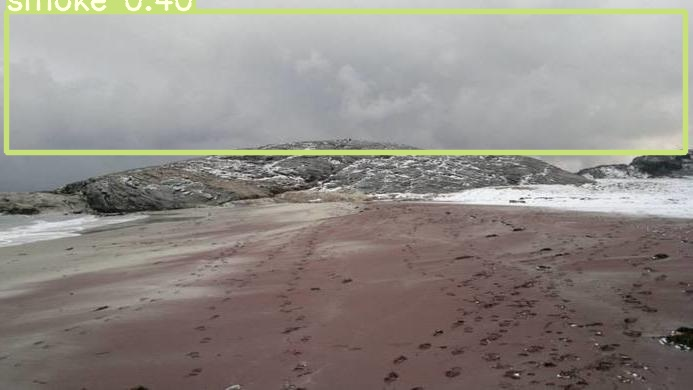

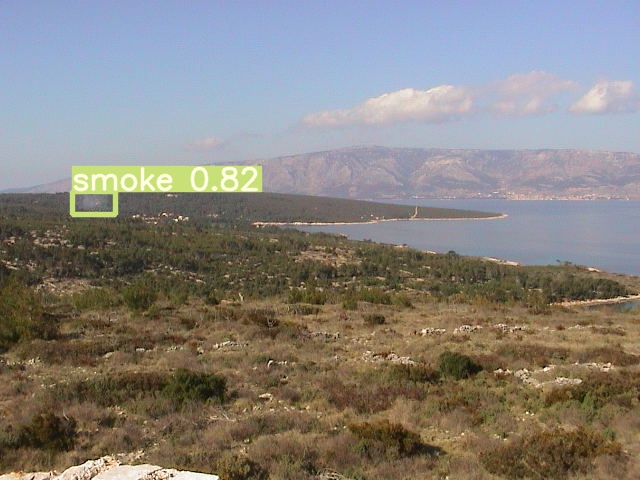

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/exp0_yolov5s_results/weights/best.pt /content/gdrive/My\ Drive

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)